In [1]:
import ddsp
import numpy as np
from ddsp.training import models, eval_util, ddsp_run
from absl import flags
import sys
import os
import gin
import tensorflow as tf
import soundfile as sf
sys.path.append("/home/han/wave2shape/src/")
import ftm_ver2 as ftm
import IPython.display as ipd
import matplotlib.pyplot as plt
import tensorflow as tf
from ddsp import spectral_ops

/home/han/miniconda3/envs/py38/lib/python3.8/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [2]:
sploss = ddsp.losses.SpectralLoss()

In [14]:
wav_path = "/home/han/data/drum_data/test/10000_sound.wav"
wav_path2 = "/home/han/data/drum_data/test/1001_sound.wav"
wav_path3 = "/home/han/data/drum_data/test/10020_sound.wav"
wav, sr = sf.read(wav_path)
wav2,sr = sf.read(wav_path2)
wav3,sr = sf.read(wav_path3)

In [4]:
loss = sploss(tf.convert_to_tensor(wav),tf.convert_to_tensor(wav2))

2022-08-23 10:02:21.134263: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-23 10:02:21.416378: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-23 10:02:21.418329: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-23 10:02:21.447064: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-23 10:02:21.448935: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from S

In [20]:
loss = sploss(tf.convert_to_tensor(wav),tf.convert_to_tensor(wav2))
loss2 = sploss(tf.convert_to_tensor(wav),tf.convert_to_tensor(wav3))
loss3 = sploss(tf.convert_to_tensor(wav2),tf.convert_to_tensor(wav3))
print(loss,loss2,loss3)

tf.Tensor(0.27280432, shape=(), dtype=float32) tf.Tensor(0.09859025, shape=(), dtype=float32) tf.Tensor(0.2754726, shape=(), dtype=float32)


In [21]:
from sklearn.neighbors import NearestNeighbors

knn=NearestNeighbors(n_neighbors=2,
                 algorithm='auto',
                 metric=lambda a,b: sploss(a,b)
                 )

In [22]:
audio_concat = np.stack([wav,wav2,wav3],axis=0)
print(audio_concat.shape)
knn.fit(audio_concat)

(3, 65536)


NearestNeighbors(metric=<function <lambda> at 0x7f741b7c91f0>, n_neighbors=2)

In [24]:
knn.kneighbors(audio_concat)

(array([[0.        , 0.09859025],
        [0.        , 0.27280432],
        [0.        , 0.09859025]]),
 array([[0, 2],
        [1, 0],
        [2, 0]]))

In [2]:
#pitch perturbed drum synth
omega = 500
tau = 0.4
p = 0.1
D = 0.01
alpha = 0.5
m = 10
sr = 22050
ref = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,tau,omega,p,D,np.pi,alpha,sr)

In [11]:
cat_sounds = []
losses = []
for pert in np.logspace(np.log10(1/4),np.log10(4),100):
    om_pert = omega*pert
    curr = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,tau,om_pert,p,D,np.pi,alpha,sr)
    loss = sploss(tf.convert_to_tensor(ref),tf.convert_to_tensor(curr))
    losses.append(loss)
    cat_sounds.append(curr[:int(sr/4)])
cat_sounds = np.concatenate(cat_sounds,axis=0)

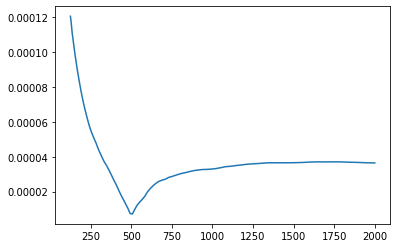

In [12]:
plt.plot(np.logspace(np.log10(1/4),np.log10(4),100)*omega,losses)

In [13]:
display(ipd.Audio(cat_sounds,rate=sr))
display(ipd.Audio(ref,rate=sr))

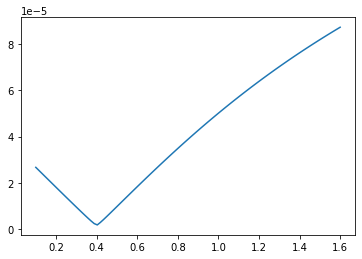

In [17]:
cat_sounds = []
losses = []
D_wr = 0.025
for pert in np.linspace(1/4,4,100):
    t_pert = tau*pert
    curr = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,t_pert,omega,p,D_wr,np.pi,alpha,sr)
    loss = sploss(tf.convert_to_tensor(ref),tf.convert_to_tensor(curr))
    losses.append(loss)
    cat_sounds.append(curr[:int(sr/4)])
cat_sounds = np.concatenate(cat_sounds,axis=0)
display(ipd.Audio(cat_sounds,rate=sr))
display(ipd.Audio(ref,rate=sr))
plt.plot(np.linspace(1/4,4,100)*tau,losses)

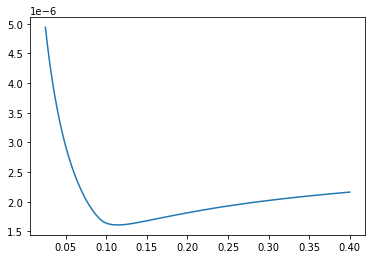

In [18]:
cat_sounds = []
losses = []
for pert in np.logspace(np.log10(1/4),np.log10(4),100):
    p_pert = p*pert
    curr = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,tau,omega,p_pert,D_wr,np.pi,alpha,sr)
    loss = sploss(tf.convert_to_tensor(ref),tf.convert_to_tensor(curr))
    losses.append(loss)
    cat_sounds.append(curr[:int(sr/4)])
cat_sounds = np.concatenate(cat_sounds,axis=0)
display(ipd.Audio(cat_sounds,rate=sr))
display(ipd.Audio(ref,rate=sr))
plt.plot(np.logspace(np.log10(1/4),np.log10(4),100)*p,losses)

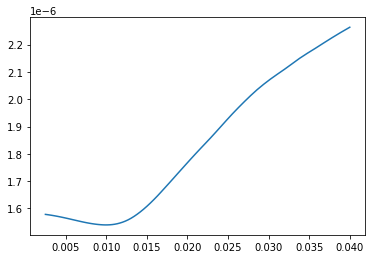

In [14]:
cat_sounds = []
losses = []
for pert in np.logspace(np.log10(1/4),np.log10(4),100):
    D_pert = D*pert
    curr = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,tau,omega,p_wr,D_pert,np.pi,alpha,sr)
    loss = sploss(tf.convert_to_tensor(ref),tf.convert_to_tensor(curr))
    losses.append(loss)
    cat_sounds.append(curr[:int(sr/4)])
cat_sounds = np.concatenate(cat_sounds,axis=0)
display(ipd.Audio(cat_sounds,rate=sr))
display(ipd.Audio(ref,rate=sr))
plt.plot(np.logspace(np.log10(1/4),np.log10(4),100)*D,losses)

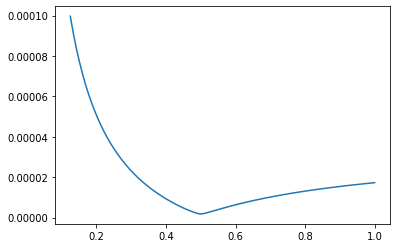

In [19]:
cat_sounds = []
losses = []
for pert in np.linspace(1/4,2,100):
    a_pert = alpha*pert
    curr = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,tau,omega,p,D_wr,np.pi,a_pert,sr)
    loss = sploss(tf.convert_to_tensor(ref),tf.convert_to_tensor(curr))
    losses.append(loss)
    cat_sounds.append(curr[:int(sr/4)])
cat_sounds = np.concatenate(cat_sounds,axis=0)
display(ipd.Audio(cat_sounds,rate=sr))
display(ipd.Audio(ref,rate=sr))
plt.plot(np.linspace(1/4,2,100)*alpha,losses)

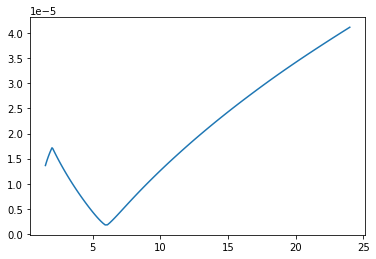

In [20]:
cat_sounds = []
losses = []
beta = 1/alpha + 1/alpha**2
for pert in np.logspace(np.log10(1/4), np.log10(4), 100):
    ba_pert = beta*pert
    root = max(np.roots([ba_pert,-1,-1]))
    a_pert = min(root,1/root) 
    
    curr = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,tau,omega,p,D_wr,np.pi,a_pert,sr)
    loss = sploss(tf.convert_to_tensor(ref),tf.convert_to_tensor(curr))
    losses.append(loss)
    cat_sounds.append(curr[:int(sr/4)])
cat_sounds = np.concatenate(cat_sounds,axis=0)
display(ipd.Audio(cat_sounds,rate=sr))
display(ipd.Audio(ref,rate=sr))
plt.plot(np.logspace(np.log10(1/4), np.log10(4), 100)*beta,losses)

JTFS euclidean dist curve

In [3]:
from kymatio.torch import TimeFrequencyScattering1D,Scattering1D
import torch

In [4]:
def comp_jtfs(jtfs,jtfs_q1,wav,num_jtfs,num_jtfs_q1):
    #compute jtfs
    jtfs_wav = jtfs(wav)/np.linalg.norm(wav,ord=2)
    jtfs_wav_q1 = jtfs_q1(wav)/np.linalg.norm(wav,ord=2)
    #concatenation
    jtfs_comb = torch.concat((jtfs_wav_q1[:,:num_jtfs_q1,:],jtfs_wav[:,num_jtfs:,:]),dim=1)
    return jtfs_comb.squeeze()

def compute_numcoef(jtfs):
    num = 0
    wav = np.random.random(N,)
    Sw_list = jtfs(wav)
    for i in Sw_list:
        if len(i['j']) == 1:
            num += 1
    return num


In [5]:
J = 14
Q = 12
F = 24
N = 2**16

#initialize jtfs instance
params = dict(J = J, #scale
        shape = (2**16, ), 
        T = N, 
        average = True,
        max_pad_factor=1,
        max_pad_factor_fr=1)


jtfs = TimeFrequencyScattering1D(**params, average_fr = True, Q = Q, F = F).cuda() #same as JTFS models similarity paper
jtfs_q1 = TimeFrequencyScattering1D(**params, average_fr = False, Q = 1).cuda()

#compute number of coef
jtfs_list = TimeFrequencyScattering1D(**params, average_fr = True, out_type = "list", Q = Q, F = F).cuda()
num_jtfs = compute_numcoef(jtfs_list)
jtfs_q1_list = TimeFrequencyScattering1D(**params, average_fr = False, out_type = "list", Q = 1).cuda()
num_jtfs_q1 = compute_numcoef(jtfs_q1_list)



Instructions for updating:
Use tf.identity instead.


2022-08-19 14:54:55.001840: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-19 14:54:55.014061: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-19 14:54:55.015050: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-19 14:54:55.017381: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-19 14:54:55.018285: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from S

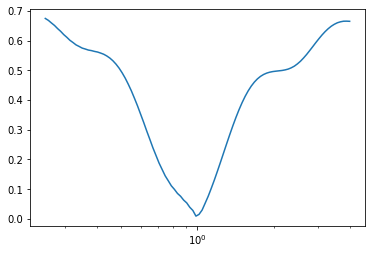

In [6]:
cat_sounds = []
losses = []
jtfs_ref = comp_jtfs(jtfs,jtfs_q1,ref,num_jtfs,num_jtfs_q1)
for pert in np.logspace(np.log10(1/4), np.log10(4), 100):
    o_pert = omega*pert
    curr = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,tau,o_pert,p,D,np.pi,alpha,sr)
    jtfs_curr = comp_jtfs(jtfs,jtfs_q1,curr,num_jtfs,num_jtfs_q1)
    loss = tf.norm(jtfs_ref.cpu()-jtfs_curr.cpu(),ord='euclidean')
    losses.append(loss.cpu().numpy())
    cat_sounds.append(curr[:int(sr/4)])
cat_sounds = np.concatenate(cat_sounds,axis=0)
display(ipd.Audio(cat_sounds,rate=sr))
display(ipd.Audio(ref,rate=sr))
plt.semilogx(np.logspace(np.log10(1/4), np.log10(4), 100),losses)

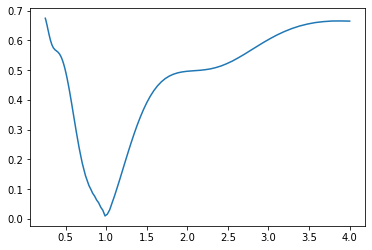

In [7]:
plt.plot(np.logspace(np.log10(1/4), np.log10(4), 100),losses)

In [10]:
Scattering1D?

In [17]:
jtfs_o1 = Scattering1D(J=J, Q=1, shape =(N,),T=N,max_order=2,average=True).cuda()

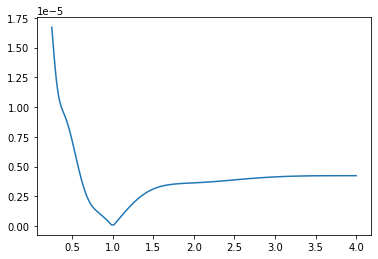

In [18]:
cat_sounds = []
losses = []
jtfs_ref = jtfs_o1(ref)
for pert in np.logspace(np.log10(1/4), np.log10(4), 100):
    o_pert = omega*pert
    curr = ftm.getsounds_imp_linear_nonorm(m,m,0.4,0.4,0.03,tau,o_pert,p,D,np.pi,alpha,sr)
    jtfs_curr = jtfs_o1(curr)
    loss = tf.norm(jtfs_ref.cpu()-jtfs_curr.cpu(),ord='euclidean')
    losses.append(loss.cpu().numpy())
    cat_sounds.append(curr[:int(sr/4)])
cat_sounds = np.concatenate(cat_sounds,axis=0)
display(ipd.Audio(cat_sounds,rate=sr))
display(ipd.Audio(ref,rate=sr))
plt.plot(np.logspace(np.log10(1/4), np.log10(4), 100),losses)